<a id = '2.0'></a>
<p style = "font-size : 40px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>ANÁLISIS PREDICTIVO DE ABANDONO EN UNA EMPRESA DE TELEFONÍA</strong></p>



<center>

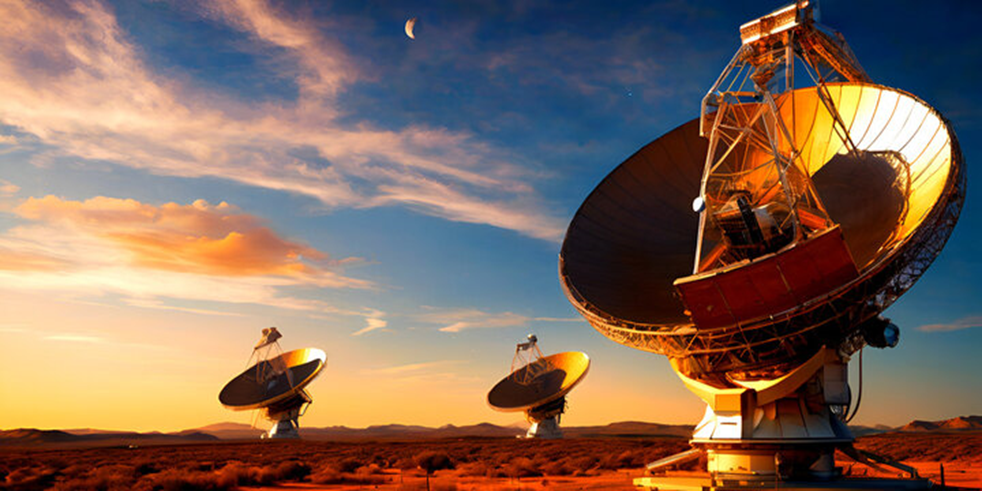



</center>
<b>
i.	INTRODUCCIÓN </b> <br>
El presente Análisis busca identificar la mejor forma de predecir que personas podrían tener riesgo de abandonar su servicio contratado, basados en resultados históricos de una empresa de telefonía celular.
Por medio de Ciencia de datos se desarrolló un conjunto de modelos para identificar las causas del abandono de los clientes y proponer soluciones de negocio de una empresa telefónica. 
Los datos históricos del cliente han sido extraídos y guardados en el archivo CustomerChurn.csv y con estos se realizaron las siguientes actividades:
<ul><li>Análisis exploratorio de datos (entender las tendencias, patrones y anomalías)</li><li>
Desarrollo de tres modelos predictivos diferentes</li><li>
Selección del modelo más eficaz y justificación de la elección</li><li>
Elaboración de un reporte detallado de los hallazgos y recomendaciones</li>
</ul>
<br>
La información histórica contiene las siguientes variables:
<ul><li>Call Failures: número de fallas en llamadas</li><li>
Complains: variable binaria que indica se hay historial de quejas (0: No hay quejas, 1: Quejas)</li><li>
Subscription Length: total de meses de suscripción</li><li>
Charge Amount: atributo ordinal (0: mínimo monto, 9: máximo monto)</li><li>
Seconds of Use: total de segundos de llamadas</li><li>
Frequency of use: número total de llamadas</li><li>
Frequency of SMS: número total de mensajes de texto</li><li>
Distinct Called Numbers: total de números distintos a los que ha llamado</li><li>
Age Group: atributo ordinal (1: edad más joven, 5: mayor edad)</li><li>
Tariff Plan: variable binaria (1: Pago por uso, 2: Contractual)</li><li>
Status: variable binaria (1: activo, 2: inactivo)</li><li>
Churn: variable binaria (1: abandono, 0: no abandono) – Etiqueta de clase</li><li>
Customer Value: Valor estimado del cliente</li></ul>
<br><b>
ii.	ANÁLISIS EXPLORATORIO (EDA)</b> <br>
<ul><li>a)	PREPARACIÓN DEL PROYECTO</li><li>
b)	ANÁLISIS EXPLORATORIO DE DATOS 1</li><li>
c)	PRE-PROCESAMIENTO Y LIMPIZA DE DATOS</li><li>
d)	ANÁLISIS EXPLORATORIO DE DATOS 2</li><li>
e)	CONCLUSIONES</li><li>
f)	SELECCIÓN DE CARACTERÍSTICAS</li></ul>
<br><b>
iii.	COMPARACIÓN DE MODELOS</b> <br>
<ul><li>a)	K-NEAREST NEIGHBORS (KNN)</li><li>
b)	DECISION TREE CLASSIFIER</li><li>
c)	RANDOM FOREST CLASSIFIER</li><li>
d)	ADA BOOST CLASSIFIER</li><li>
e)	GRADIENT BOOSTING CLASSIFIER</li><li>
f)	STOCHASTIC GRADIENT BOOSTING (SGB)</li><li>
g)	XGBOOST</li><li>
h)	CAT BOOST CLASSIFIER</li><li>
i)	EXTRA TREES CLASSIFIER</li><li>
j)	LGBM CLASSIFIER</li><li>
k)	SELECCIÓN DEL MODELO GANADOR</li></ul>


<a id = '2.0'></a>
<p style = "font-size : 40px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>II.ANÁLISIS EXPLORATORIO (EDA)</strong></p>



<a id = '2.0'></a>
<p style = "font-size : 40px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>a) PREPARACION DEL PROYECTO</strong></p>



In [1]:
# 1. PREPARACION DEL PROYECTO
# a) Importacion de Paquetes 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')
%matplotlib inline
pd.set_option('display.max_columns', 26)
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report


In [2]:
# b. Carga de datos
df= pd.read_csv('CustomerChurn.csv')
df.head()

,Call Failure,Complains,Subscription Length,Charge Amount,Seconds of Use,Frequency of use,Frequency of SMS,Distinct Called Numbers,Age Group,Tariff Plan,Status,Age,Customer Value,Churn
0,8,0,38,0,4370,71,5,17,3,1,1,30,197.640,0
1,0,0,39,0,318,5,7,4,2,1,2,25,46.035,0
2,10,0,37,0,2453,60,359,24,3,1,1,30,1536.520,0
3,10,0,38,0,4198,66,1,35,1,1,1,15,240.020,0
4,3,0,38,0,2393,58,2,33,1,1,1,15,145.805,0


In [3]:
# c. Revision del Tamano de Matriz
df.shape

(3150, 14)

Se transforman las cabeceras para un mayor entendimiento de los datos:
<UL><LI>Call Failures: 'llamadasFallidas'</LI><LI>
Complains: 'quejas'</LI><LI>
Length: 'mesesSubscripcion'</LI><LI>
Subscription Charge Amount: 'nivelMonto'</LI><LI>
Seconds of Use: 'segundosUtilizados'</LI><LI>
Frequency of use: 'frecuenciaDeUso'</LI><LI>
Frequency of SMS: 'usoSms'</LI><LI>
Distinct Called Numbers: 'numerosMarcadosUnicos'</LI><LI>
Age Group: 'grupoDeEdad'</LI><LI>
Tariff Plan: 'planTarifario'</LI><LI>
Status: 'estatus'</LI><LI>
Churn: 'abandono'</LI><LI>
Age: 'edad'</LI><LI>
Customer Value: 'valorCliente'</LI></ul>

In [4]:
# d. Bautizar columnas con nombres amigables
df.columns = ['llamadasFallidas','quejas','mesesSubscripcion','nivelMonto','segundosUtilizados','frecuenciaDeUso','usoSms','numerosMarcadosUnicos','grupoDeEdad','planTarifario','estatus','edad','valorCliente','abandono']


In [5]:
# e. Validar Bautizmo de columnas con nombres amigables
df.head()

,llamadasFallidas,quejas,mesesSubscripcion,nivelMonto,segundosUtilizados,frecuenciaDeUso,usoSms,numerosMarcadosUnicos,grupoDeEdad,planTarifario,estatus,edad,valorCliente,abandono
0,8,0,38,0,4370,71,5,17,3,1,1,30,197.640,0
1,0,0,39,0,318,5,7,4,2,1,2,25,46.035,0
2,10,0,37,0,2453,60,359,24,3,1,1,30,1536.520,0
3,10,0,38,0,4198,66,1,35,1,1,1,15,240.020,0
4,3,0,38,0,2393,58,2,33,1,1,1,15,145.805,0


<a id = '2.0'></a>
<p style = "font-size : 40px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>b) Analisis Exploratorio de Datos 1 (EDA1) </strong></p>




<BR>
<B>ANÁLISIS EXPLORATORIO DE DATOS I</B><BR>
Se realizará un análisis exploratorio de datos inicial para entender la estructura general de la data, posteriormente se realizará un segundo bloque de análisis para revisar la información con datos etiquetados.



In [6]:
# 2. Analisis Exploratorio
# a. Estadisticas de Datos
df.describe()

,llamadasFallidas,quejas,mesesSubscripcion,nivelMonto,segundosUtilizados,frecuenciaDeUso,usoSms,numerosMarcadosUnicos,grupoDeEdad,planTarifario,estatus,edad,valorCliente,abandono
count,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000
mean,7.627937,0.076508,32.541905,0.942857,4472.459683,69.460635,73.174921,23.509841,2.826032,1.077778,1.248254,30.998413,470.972916,0.157143
std,7.263886,0.265851,8.573482,1.521072,4197.908687,57.413308,112.237560,17.217337,0.892555,0.267864,0.432069,8.831095,517.015433,0.363993
min,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,15.000000,0.000000,0.000000
25%,1.000000,0.000000,30.000000,0.000000,1391.250000,27.000000,6.000000,10.000000,2.000000,1.000000,1.000000,25.000000,113.801250,0.000000
50%,6.000000,0.000000,35.000000,0.000000,2990.000000,54.000000,21.000000,21.000000,3.000000,1.000000,1.000000,30.000000,228.480000,0.000000
75%,12.000000,0.000000,38.000000,1.000000,6478.250000,95.000000,87.000000,34.000000,3.000000,1.000000,1.000000,30.000000,788.388750,0.000000
max,36.000000,1.000000,47.000000,10.000000,17090.000000,255.000000,522.000000,97.000000,5.000000,2.000000,2.000000,55.000000,2165.280000,1.000000


In [7]:
#b. Generacion de reporte ydata_profiling
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title= "Reporte Exploratorio Abandono en Telemarketing")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

HALLAZGOS REPORTE YDATA PROFILING
Se identifican las siguientes correlaciones en la data:
<UL><LI>abandono está altamente correlacionado con quejas - ALTA  CORRELACIÓN</LI><LI>
edad está altamente correlacionado con grupoDeEdad - ALTA  CORRELACIÓN</LI><LI>
estatus está altamente correlacionado con frecuenciaDeUso - ALTA  CORRELACIÓN</LI><LI>
frecuenciaDeUso está altamente correlacionado con estatus - ALTA  CORRELACIÓN</LI><LI>
grupoDeEdad está altamente correlacionado con edad - ALTA  CORRELACIÓN</LI><LI>
llamadasFallidas está altamente correlacionado con frecuenciaDeUso - ALTA  CORRELACIÓN</LI><LI>
nivelMonto está altamente correlacionado con llamadasFallidas - ALTA  CORRELACIÓN</LI><LI>
numerosMarcadosUnicos está altamente correlacionado con frecuenciaDeUso - ALTA  CORRELACIÓN</LI><LI>
quejas está altamente correlacionado con abandono - ALTA  CORRELACIÓN</LI><LI>
segundosUtilizados está altamente correlacionado con estatus - ALTA  CORRELACIÓN</LI><LI>
usoSms está altamente correlacionado con valorCliente - ALTA  CORRELACIÓN</LI><LI>
valorCliente está altamente correlacionado con estatus - ALTA  CORRELACIÓN</LI>
Esto da sospechas de que una parte del abandono puede venir de las quejas en el servicio, sin embargo más adelante identificaremos que tal vez no es tan relevante.


In [8]:
# c. Reporte de Correlacion

import plotly.express as px

# Suponiendo que 'df' es tu DataFrame y ya está cargado
# Calcula la correlación
correlation_matrix = df.corr(numeric_only=True)

# Usa Plotly para crear el heatmap
fig = px.imshow(correlation_matrix,
                text_auto=True,  # Esto mostrará los valores de las celdas
                aspect="auto",   # Ajusta el aspecto del gráfico
                color_continuous_scale='RdBu_r')  # Paleta de colores

# Ajustes adicionales para el gráfico
fig.update_layout(
    title='Matriz de Correlación',
    xaxis_title='Variables',
    yaxis_title='Variables',
    width=1400,
    height=800
)

# Mostrar el gráfico
fig.show()

Patrones de datos:<BR>
<UL><LI>No se identifican valores nulos.</LI><LI>
Se identifican 7 registros con rangos de 4 a 6 duplicados para varios usuarios, pero al ser tantos datos podemos considerar posible  en que se den casualidades.</LI></UL>
HALLAZGOS CORRELACIÓN PLOTLY EXPRESS<BR>
Igual que con YDATA se identifican las siguientes correlaciones de ABANDONO en la data:<BR>
<UL><LI>Quejas 0.53 y Estatus 0.49</LI></UL>
Otras correlaciones interesantes son:<BR>
<UL><LI>El uso de SMS con el Valor del Cliente supera otros valores como segundos utilizados, nivel del monto o Frecuencia de uso.</LI><LI>
Algunas son obvias como segundos utilizados, nivel del monto o Frecuencia de uso con los Números marcados únicos.</LI></UL>


<a id = '2.0'></a>
<p style = "font-size : 40px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>c) Preprocesamiento y limpieza de datos</strong></p>



In [9]:
# 3. Preprocesamiento y limpieza de datos
# a. Identificar tipo de datos por columna
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3150 entries, 0 to 3149
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   llamadasFallidas       3150 non-null   int64  
 1   quejas                 3150 non-null   int64  
 2   mesesSubscripcion      3150 non-null   int64  
 3   nivelMonto             3150 non-null   int64  
 4   segundosUtilizados     3150 non-null   int64  
 5   frecuenciaDeUso        3150 non-null   int64  
 6   usoSms                 3150 non-null   int64  
 7   numerosMarcadosUnicos  3150 non-null   int64  
 8   grupoDeEdad            3150 non-null   int64  
 9   planTarifario          3150 non-null   int64  
 10  estatus                3150 non-null   int64  
 11  edad                   3150 non-null   int64  
 12  valorCliente           3150 non-null   float64
 13  abandono               3150 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 344.7 KB


In [10]:
# b. Agregar columna Minutos utilizados 
df['minutosUtilizados'] = df['segundosUtilizados'] / 60

In [11]:
# c. Agregar columna Anos de Suscripcion  
df['anosSubscripcion'] = df['mesesSubscripcion'] / 12

In [12]:
# d. Haremos unas conversiones de Datos 
# Convertir as columnas  a category
df[['edad','quejas', 'nivelMonto', 'grupoDeEdad', 'planTarifario', 'estatus', 'abandono']] = df[['edad','quejas', 'nivelMonto', 'grupoDeEdad', 'planTarifario', 'estatus', 'abandono']].astype('category')
# Validar conversion
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3150 entries, 0 to 3149
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   llamadasFallidas       3150 non-null   int64   
 1   quejas                 3150 non-null   category
 2   mesesSubscripcion      3150 non-null   int64   
 3   nivelMonto             3150 non-null   category
 4   segundosUtilizados     3150 non-null   int64   
 5   frecuenciaDeUso        3150 non-null   int64   
 6   usoSms                 3150 non-null   int64   
 7   numerosMarcadosUnicos  3150 non-null   int64   
 8   grupoDeEdad            3150 non-null   category
 9   planTarifario          3150 non-null   category
 10  estatus                3150 non-null   category
 11  edad                   3150 non-null   category
 12  valorCliente           3150 non-null   float64 
 13  abandono               3150 non-null   category
 14  minutosUtilizados      3150 non-null   f

In [13]:
# e. Categorizando
cat_cols = [col for col in df.columns if df[col].dtype == 'category']
num_cols = [col for col in df.columns if df[col].dtype != 'category']

In [14]:
# f. Buscando valores unicos en columnas categoricas
for col in cat_cols:
    print(f"{col} tiene {df[col].unique()} valores\n")

quejas tiene [0, 1]
Categories (2, int64): [0, 1] valores

nivelMonto tiene [0, 1, 2, 3, 8, ..., 9, 7, 5, 10, 6]
Length: 11
Categories (11, int64): [0, 1, 2, 3, ..., 7, 8, 9, 10] valores

grupoDeEdad tiene [3, 2, 1, 4, 5]
Categories (5, int64): [1, 2, 3, 4, 5] valores

planTarifario tiene [1, 2]
Categories (2, int64): [1, 2] valores

estatus tiene [1, 2]
Categories (2, int64): [1, 2] valores

edad tiene [30, 25, 15, 45, 55]
Categories (5, int64): [15, 25, 30, 45, 55] valores

abandono tiene [0, 1]
Categories (2, int64): [0, 1] valores



In [15]:
# g. Asignando etiquetas a las categorias
# Asignar etiquetas para niveles de colesterol, glucosa y género (si es necesario)
df['quejas'] = df['quejas'].cat.rename_categories({
    0: 'No hay quejas', 
    1: 'Quejas'
})

df['nivelMonto'] = df['nivelMonto'].cat.rename_categories({
    0: 'Nivel 0', 
    1: 'Nivel 1', 
    2: 'Nivel 2', 
    3: 'Nivel 3',
    4: 'Nivel 4',
    5: 'Nivel 5',
    6: 'Nivel 6',
    7: 'Nivel 7',
    8: 'Nivel 8',
    9: 'Nivel 9',
    10: 'Nivel 10'
})

df['grupoDeEdad'] = df['grupoDeEdad'].cat.rename_categories({
    1: 'De 15 a 24', 
    2: 'De 25 a 30', 
    3: 'De 31 a 44',
    4: 'De 45 a 54',
    5: 'De 55 a 60'
})

df['planTarifario'] = df['planTarifario'].cat.rename_categories({
    1: 'Pago por uso', 
    2: 'Contractual'
})

df['estatus'] = df['estatus'].cat.rename_categories({
    1: 'Activo', 
    2: 'No Activo'
})

df['edad'] = df['edad'].cat.rename_categories({
    15: '15', 
    25: '25', 
    30: '30',
    45: '45',
    55: '55'
})

df['abandono'] = df['abandono'].cat.rename_categories({
    0: 'No Abandono', 
    1: 'Abandono'
})

#Revisando nuevas etiquetas
for col in cat_cols:
    print(f"{col} has {df[col].unique()} values\n")

quejas has ['No hay quejas', 'Quejas']
Categories (2, object): ['No hay quejas', 'Quejas'] values

nivelMonto has ['Nivel 0', 'Nivel 1', 'Nivel 2', 'Nivel 3', 'Nivel 8', ..., 'Nivel 9', 'Nivel 7', 'Nivel 5', 'Nivel 10', 'Nivel 6']
Length: 11
Categories (11, object): ['Nivel 0', 'Nivel 1', 'Nivel 2', 'Nivel 3', ..., 'Nivel 7', 'Nivel 8', 'Nivel 9', 'Nivel 10'] values

grupoDeEdad has ['De 31 a 44', 'De 25 a 30', 'De 15 a 24', 'De 45 a 54', 'De 55 a 60']
Categories (5, object): ['De 15 a 24', 'De 25 a 30', 'De 31 a 44', 'De 45 a 54', 'De 55 a 60'] values

planTarifario has ['Pago por uso', 'Contractual']
Categories (2, object): ['Pago por uso', 'Contractual'] values

estatus has ['Activo', 'No Activo']
Categories (2, object): ['Activo', 'No Activo'] values

edad has ['30', '25', '15', '45', '55']
Categories (5, object): ['15', '25', '30', '45', '55'] values

abandono has ['No Abandono', 'Abandono']
Categories (2, object): ['No Abandono', 'Abandono'] values



In [16]:
# h. Buscando valores unicos en columnas categoricas y numericas
for col in df:
    print(f"{col} has {df[col].unique()} values\n")

llamadasFallidas has [ 8  0 10  3 11  4 13  7  6  9 25  2 23 21  1 16 12 14 28  5 26 24 19 15
 22 20 18 17 30 27 29 31 33 35 32 34 36] values

quejas has ['No hay quejas', 'Quejas']
Categories (2, object): ['No hay quejas', 'Quejas'] values

mesesSubscripcion has [38 39 37 33 36 34 35 31 27 26 25 18 17 15 16  9 40 41 29 28 20 19 11 32
 24 23 13 14  7 42 43 30 22 21 12  5 44 45 10  3  6  8  4 46 47] values

nivelMonto has ['Nivel 0', 'Nivel 1', 'Nivel 2', 'Nivel 3', 'Nivel 8', ..., 'Nivel 9', 'Nivel 7', 'Nivel 5', 'Nivel 10', 'Nivel 6']
Length: 11
Categories (11, object): ['Nivel 0', 'Nivel 1', 'Nivel 2', 'Nivel 3', ..., 'Nivel 7', 'Nivel 8', 'Nivel 9', 'Nivel 10'] values

segundosUtilizados has [4370  318 2453 ... 8527 2447 1082] values

frecuenciaDeUso has [ 71   5  60  66  58  82  39 121 169  83  95  54 225  27 182  86  14   0
 127 154  75  47  93  98  22  41  44   2  25  97   7   4 238 116  53  36
  10  32  61  26 141 171  45  40  19  74   8  63  69  85  42 124 172  57
 228  30 185 

In [17]:
# i. Borrar Nulls
df.isnull().values.any()

False

<a id = '2.0'></a>
<p style = "font-size : 40px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>d) Analisis Exploratorio de Datos 2 (EDA2)</strong></p>



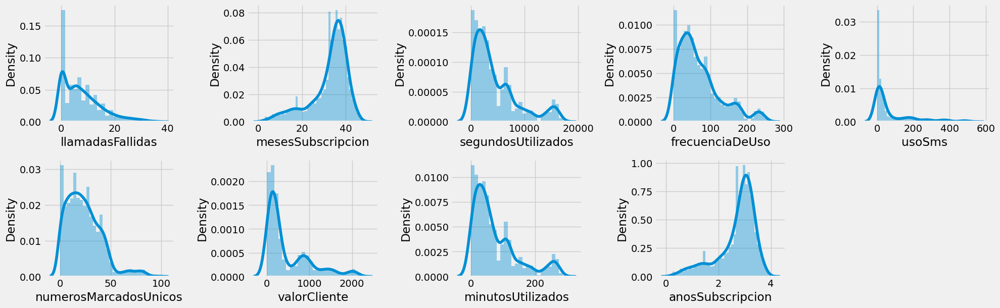

In [18]:
# a. Revisar curvas en datos numericos
plt.figure(figsize = (20, 15))
plotnumber = 1
for column in num_cols:
    if plotnumber <= 14:
        ax = plt.subplot(5, 5, plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column)
    plotnumber += 1
plt.tight_layout()
plt.show()

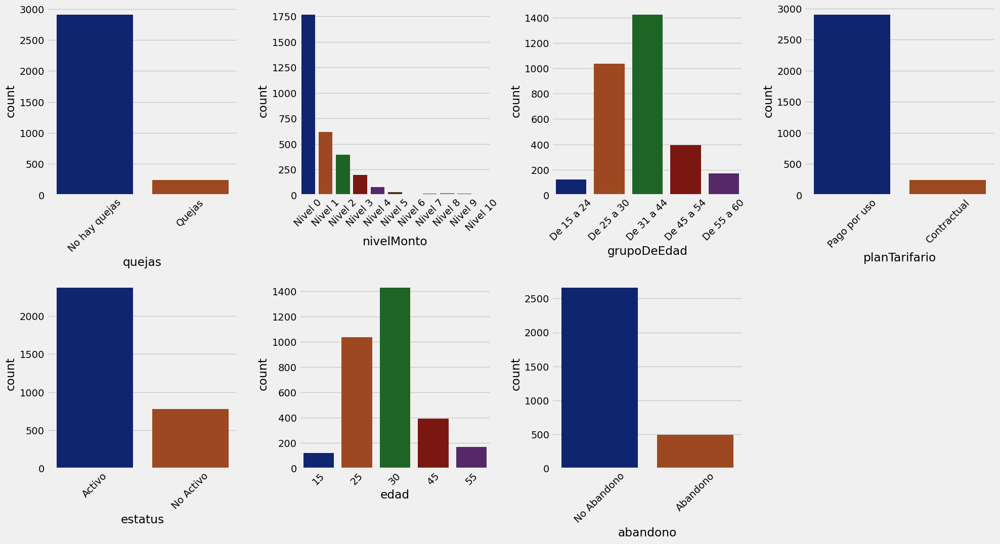

In [19]:
# b. Revisar distribucion en datos categoricos
plt.figure(figsize=(20, 15))
plotnumber = 1

for column in cat_cols:
    if plotnumber <= 11:
        ax = plt.subplot(3, 4, plotnumber)
        sns.countplot(data=df, x=column, palette='dark')
        plt.xlabel(column)
        plt.xticks(rotation=45)  # Ajustar las etiquetas del eje x para que sean legibles

    plotnumber += 1

plt.tight_layout()
plt.show()

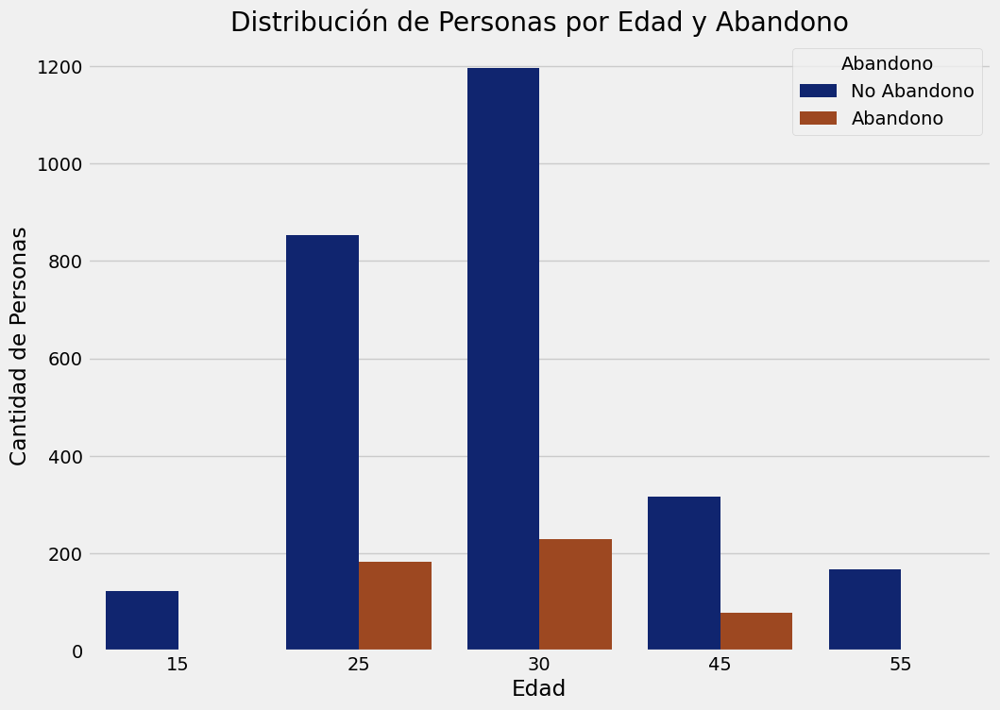

In [20]:
# c. Abandono Vs. Edad
rcParams['figure.figsize'] = 11, 8
sns.countplot(x='edad', hue='abandono', data = df, palette="dark")  
# Añadir títulos y etiquetas
plt.title('Distribución de Personas por Edad y Abandono')
plt.xlabel('Edad')
plt.ylabel('Cantidad de Personas')
plt.legend(title='Abandono')
plt.show()

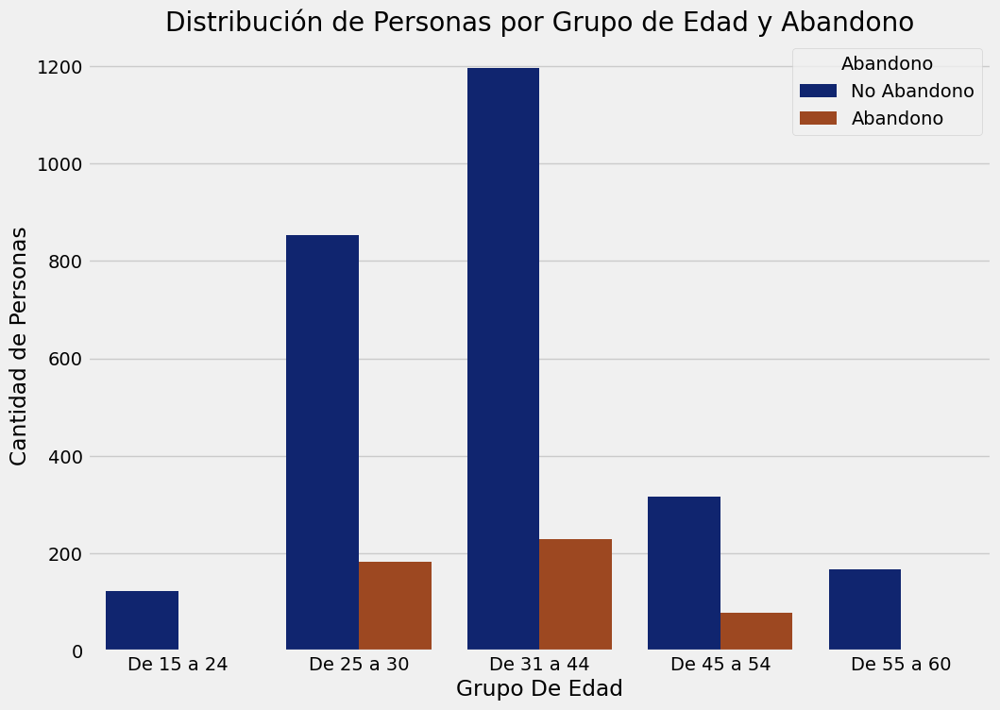

In [21]:
# d. Abandono Vs. Grupo de Edad
rcParams['figure.figsize'] = 11, 8
sns.countplot(x='grupoDeEdad', hue='abandono', data = df, palette="dark")  
# Añadir títulos y etiquetas
plt.title('Distribución de Personas por Grupo de Edad y Abandono')
plt.xlabel('Grupo De Edad')
plt.ylabel('Cantidad de Personas')
plt.legend(title='Abandono')
plt.show()

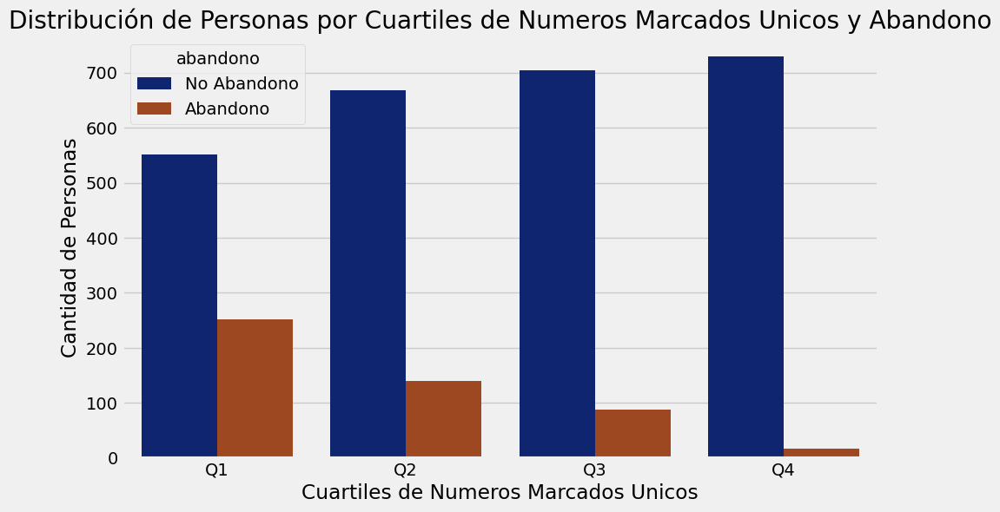

In [22]:
# e. Grafico cuartiles de Numeros Marcados Unicos Vs. abandono 
df['cuartil_numerosMarcadosUnicos'] = pd.qcut(df['numerosMarcadosUnicos'], 4, labels=['Q1', 'Q2', 'Q3', 'Q4'])

# Contar las personas en cada cuartil y cada categoría de enfermedad
cuartiles_count = df.groupby(['cuartil_numerosMarcadosUnicos', 'abandono']).size().reset_index(name='count')

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
sns.barplot(x='cuartil_numerosMarcadosUnicos', y='count', hue='abandono', data=cuartiles_count, palette='dark')

# Añadir títulos y etiquetas
plt.title('Distribución de Personas por Cuartiles de Numeros Marcados Unicos y Abandono')
plt.xlabel('Cuartiles de Numeros Marcados Unicos')
plt.ylabel('Cantidad de Personas')
plt.legend(title='abandono')
plt.show()

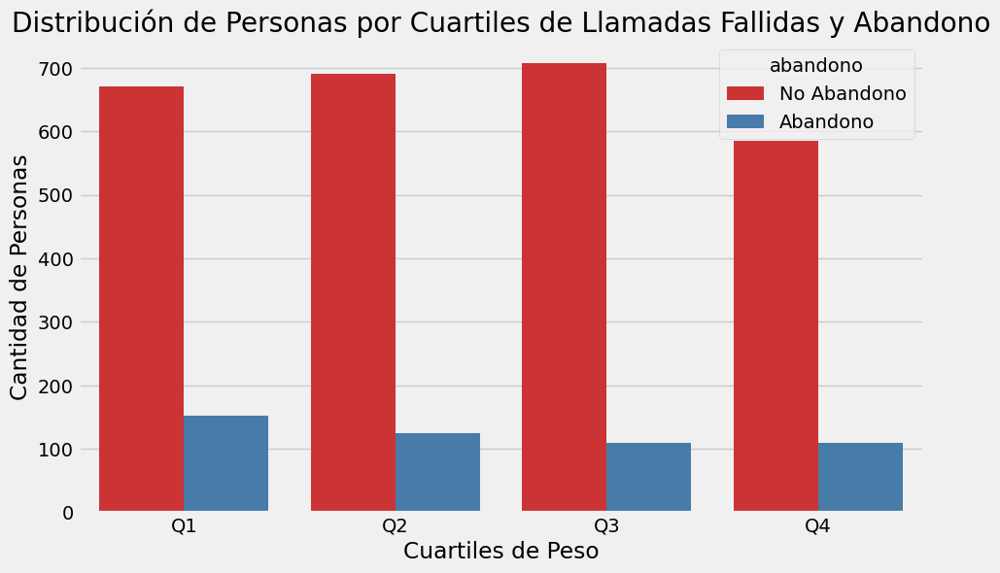

In [23]:
# f. Grafico cuartiles de llamadasFallidas Vs. abandono 
df['cuartil_llamadasFallidas'] = pd.qcut(df['llamadasFallidas'], 4, labels=['Q1', 'Q2', 'Q3', 'Q4'])

# Contar las personas en cada cuartil y cada categoría de enfermedad
cuartiles_count = df.groupby(['cuartil_llamadasFallidas', 'abandono']).size().reset_index(name='count')

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
sns.barplot(x='cuartil_llamadasFallidas', y='count', hue='abandono', data=cuartiles_count, palette='Set1')

# Añadir títulos y etiquetas
plt.title('Distribución de Personas por Cuartiles de Llamadas Fallidas y Abandono')
plt.xlabel('Cuartiles de Peso')
plt.ylabel('Cantidad de Personas')
plt.legend(title='abandono')
plt.show()

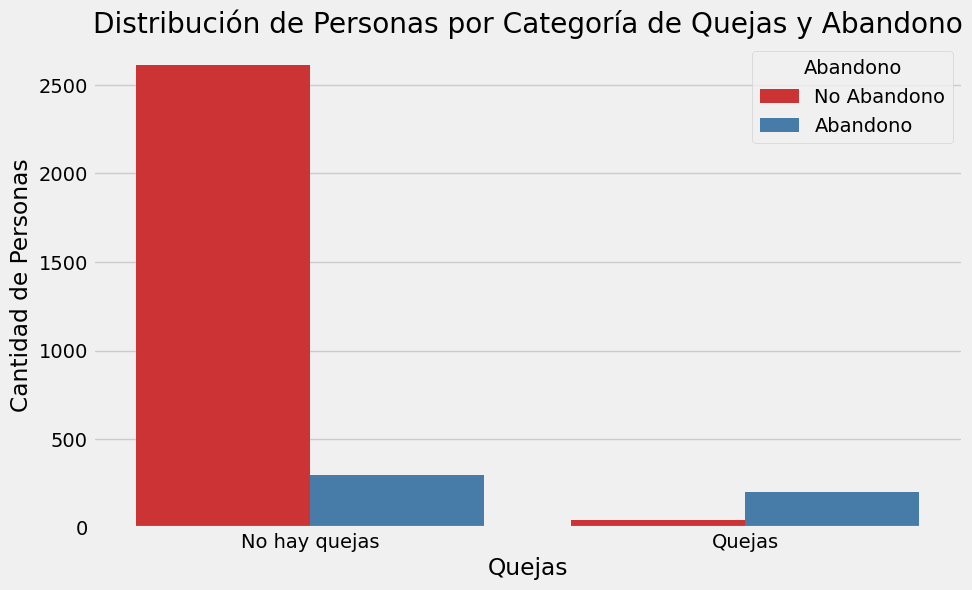

In [24]:
# g. Grafico cuartiles de quejas Vs. abandono 
# Contar las personas en cada categoría de quejas y abandono
cuartiles_count = df.groupby(['quejas', 'abandono']).size().reset_index(name='count')

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
sns.barplot(x='quejas', y='count', hue='abandono', data=cuartiles_count, palette='Set1')

# Añadir títulos y etiquetas
plt.title('Distribución de Personas por Categoría de Quejas y Abandono')
plt.xlabel('Quejas')
plt.ylabel('Cantidad de Personas')
plt.legend(title='Abandono')
plt.show()


<Axes: xlabel='mesesSubscripcion', ylabel='count'>

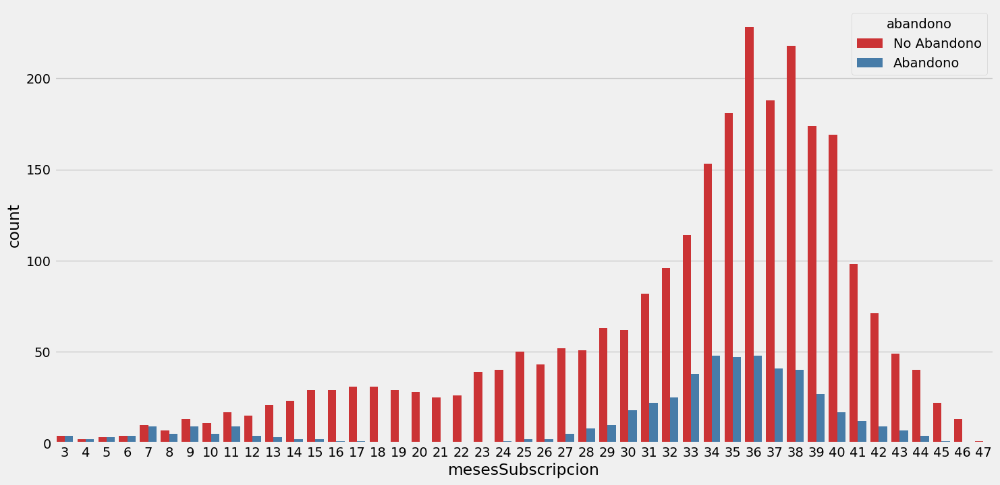

In [25]:
# h. Grafico Abandono Vs. Meses Subscripcion
rcParams['figure.figsize'] = 16, 8
sns.countplot(x='mesesSubscripcion', hue='abandono', data = df, palette="Set1")  

<Axes: xlabel='nivelMonto', ylabel='count'>

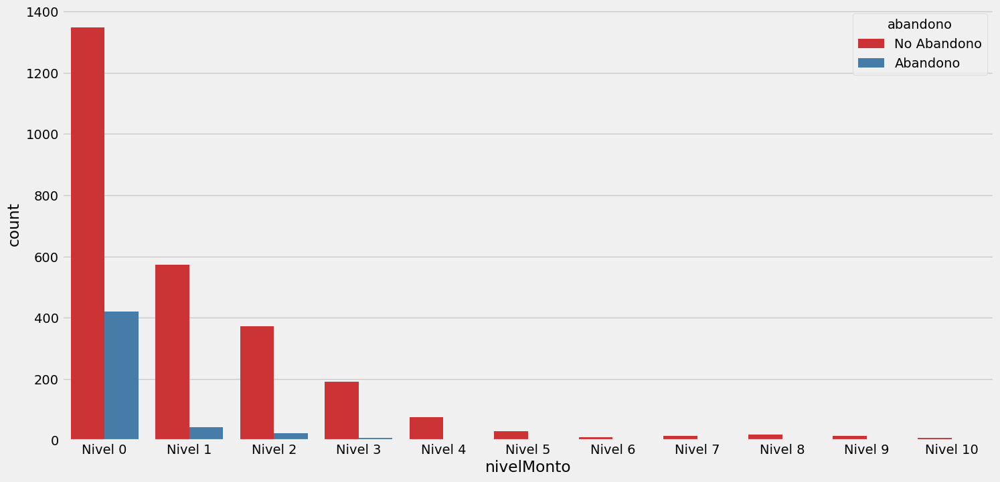

In [26]:
# i. Grafico Abandono Vs. nivelMonto
rcParams['figure.figsize'] = 16, 8
sns.countplot(x='nivelMonto', hue='abandono', data = df, palette="Set1")  

<Axes: xlabel='planTarifario', ylabel='count'>

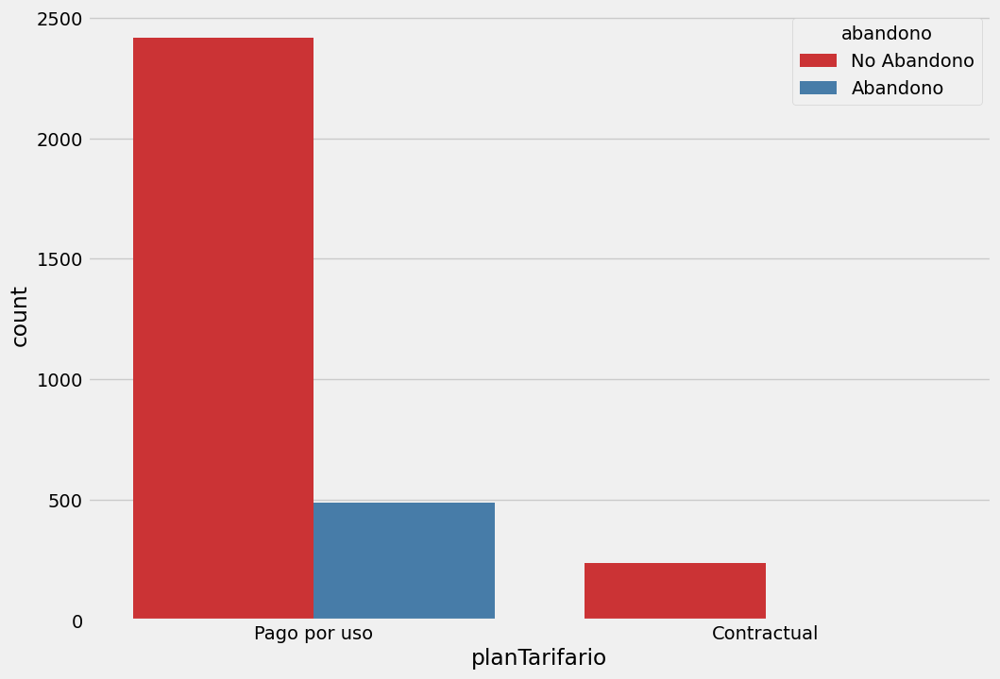

In [27]:
# j. Grafico Abandono Vs. planTarifario
rcParams['figure.figsize'] = 11, 8
sns.countplot(x='planTarifario', hue='abandono', data = df, palette="Set1")  

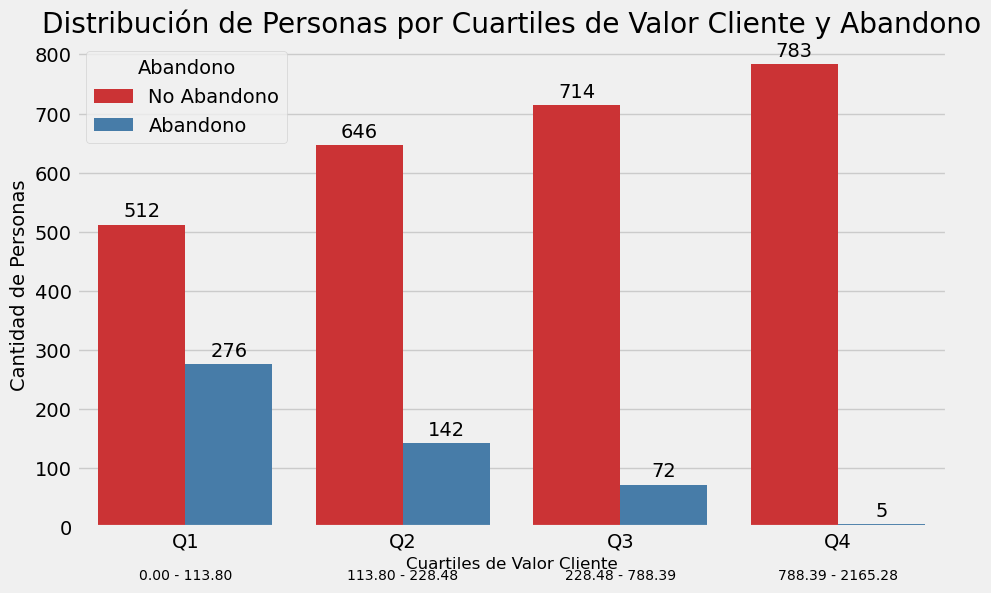

In [28]:
# k. Grafico cuartiles de valorCliente Vs. abandono 
# Crear los cuartiles basados en la columna valorCliente y obtener los límites de los cuartiles
cuartiles, bins = pd.qcut(df['valorCliente'], 4, labels=['Q1', 'Q2', 'Q3', 'Q4'], retbins=True)

# Asignar los cuartiles al DataFrame
df['cuartil_valorCliente'] = cuartiles

# Contar las personas en cada cuartil y cada categoría de abandono
cuartiles_count = df.groupby(['cuartil_valorCliente', 'abandono']).size().reset_index(name='count')

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='cuartil_valorCliente', y='count', hue='abandono', data=cuartiles_count, palette='Set1')

# Añadir las etiquetas de valor encima de cada barra
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=3)

# Añadir las anotaciones con los rangos de los cuartiles
rango_cuartiles = [f"{bins[i]:.2f} - {bins[i+1]:.2f}" for i in range(len(bins)-1)]
for i, rango in enumerate(rango_cuartiles):
    ax.annotate(rango, xy=(i, 0), xycoords=('data', 'axes fraction'), 
                xytext=(0, -30), textcoords='offset points', va='top', ha='center', fontsize=10, color='black')

# Añadir títulos y etiquetas con fuente reducida en el eje X
plt.title('Distribución de Personas por Cuartiles de Valor Cliente y Abandono')
plt.xlabel('Cuartiles de Valor Cliente', fontsize=12)  # Reducir el tamaño de la fuente aquí
plt.ylabel('Cantidad de Personas', fontsize=14)
plt.legend(title='Abandono')
plt.show()

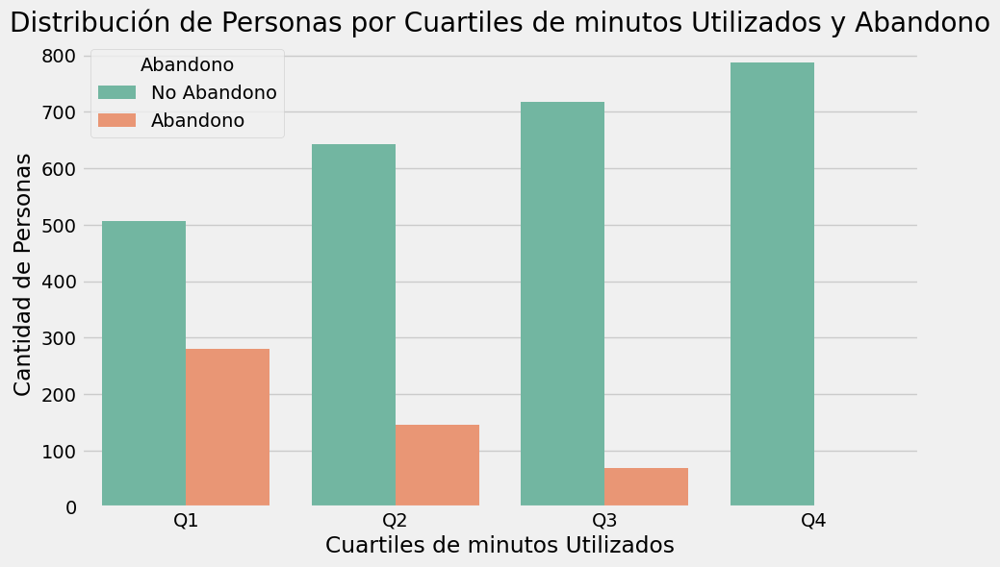

In [29]:
# k. Grafico cuartiles de Minutos Utilizados Vs. abandono 
df['cuartil_minutosUtilizados'] = pd.qcut(df['minutosUtilizados'], 4, labels=['Q1', 'Q2', 'Q3', 'Q4'])

# Contar las personas en cada cuartil y cada categoría de enfermedad
cuartiles_count = df.groupby(['cuartil_minutosUtilizados', 'abandono']).size().reset_index(name='count')

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
sns.barplot(x='cuartil_minutosUtilizados', y='count', hue='abandono', data=cuartiles_count, palette='Set2')

# Añadir títulos y etiquetas
plt.title('Distribución de Personas por Cuartiles de minutos Utilizados y Abandono')
plt.xlabel('Cuartiles de minutos Utilizados')
plt.ylabel('Cantidad de Personas')
plt.legend(title='Abandono')
plt.show()

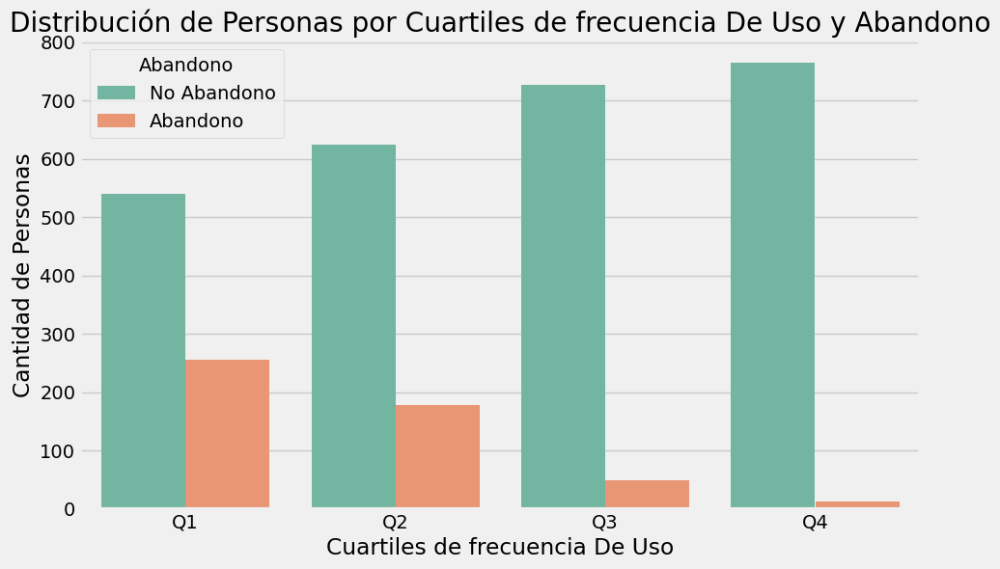

In [30]:
# l. Grafico cuartiles de frecuencia De Uso Vs. abandono 
df['cuartil_frecuenciaDeUso'] = pd.qcut(df['frecuenciaDeUso'], 4, labels=['Q1', 'Q2', 'Q3', 'Q4'])

# Contar las personas en cada cuartil y cada categoría de enfermedad
cuartiles_count = df.groupby(['cuartil_frecuenciaDeUso', 'abandono']).size().reset_index(name='count')

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
sns.barplot(x='cuartil_frecuenciaDeUso', y='count', hue='abandono', data=cuartiles_count, palette='Set2')

# Añadir títulos y etiquetas
plt.title('Distribución de Personas por Cuartiles de frecuencia De Uso y Abandono')
plt.xlabel('Cuartiles de frecuencia De Uso')
plt.ylabel('Cantidad de Personas')
plt.legend(title='Abandono')
plt.show()

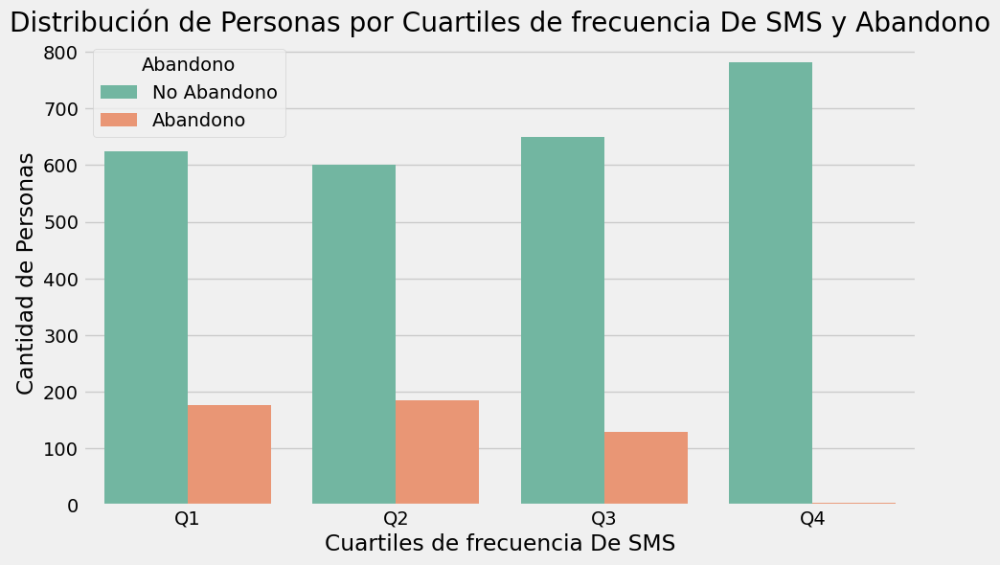

In [31]:
# m. Grafico cuartiles de Uso de Sms Vs. abandono 
df['cuartil_usoSms'] = pd.qcut(df['usoSms'], 4, labels=['Q1', 'Q2', 'Q3', 'Q4'])

# Contar las personas en cada cuartil y cada categoría de enfermedad
cuartiles_count = df.groupby(['cuartil_usoSms', 'abandono']).size().reset_index(name='count')

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
sns.barplot(x='cuartil_usoSms', y='count', hue='abandono', data=cuartiles_count, palette='Set2')

# Añadir títulos y etiquetas
plt.title('Distribución de Personas por Cuartiles de frecuencia De SMS y Abandono')
plt.xlabel('Cuartiles de frecuencia De SMS')
plt.ylabel('Cantidad de Personas')
plt.legend(title='Abandono')
plt.show()

<Axes: xlabel='estatus', ylabel='count'>

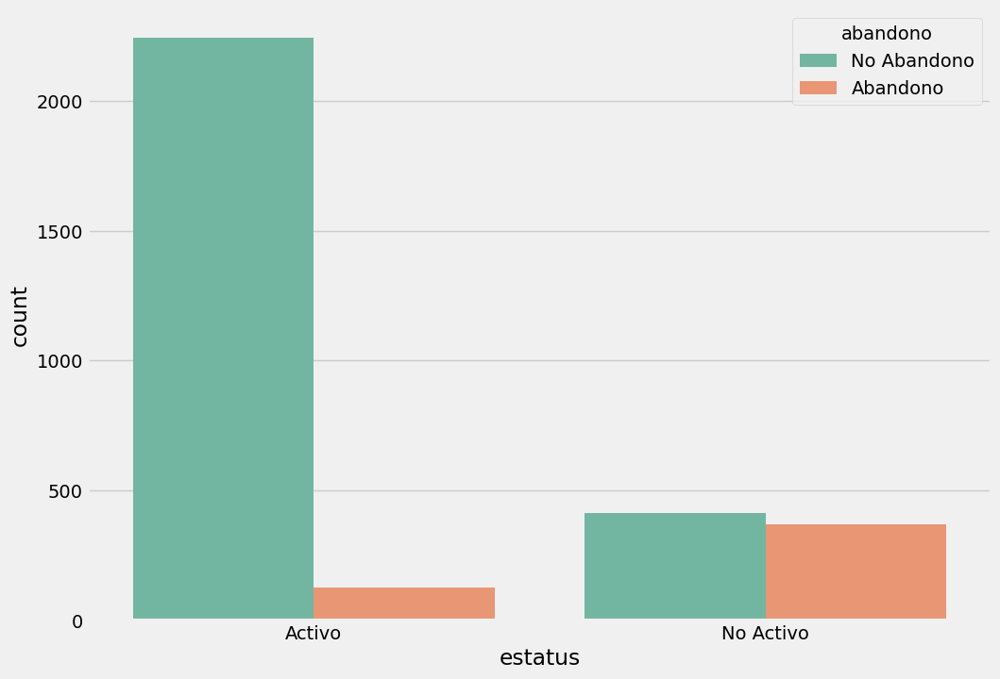

In [32]:
# n. Grafico Abandono Vs. estatus
rcParams['figure.figsize'] = 11, 8
sns.countplot(x='estatus', hue='abandono', data = df, palette="Set2")  

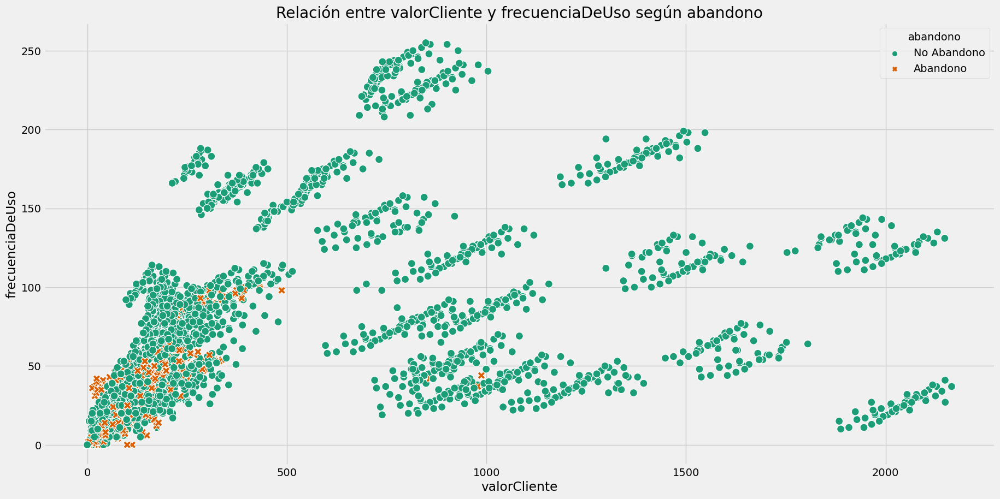

In [33]:
# o. Grafico Abandono Vs. Valor Cliente y Frecuencia De Uso
# Configurar el tamaño de la figura
plt.figure(figsize=(20, 10))
# Crear el gráfico de dispersión
sns.scatterplot(x='valorCliente', y='frecuenciaDeUso', hue='abandono', data=df, palette="Dark2", style='abandono',  s=100)
# Añadir títulos y etiquetas
plt.title('Relación entre valorCliente y frecuenciaDeUso según abandono')
plt.xlabel('valorCliente')
plt.ylabel('frecuenciaDeUso')
plt.legend(title='abandono', loc='best')
plt.show()

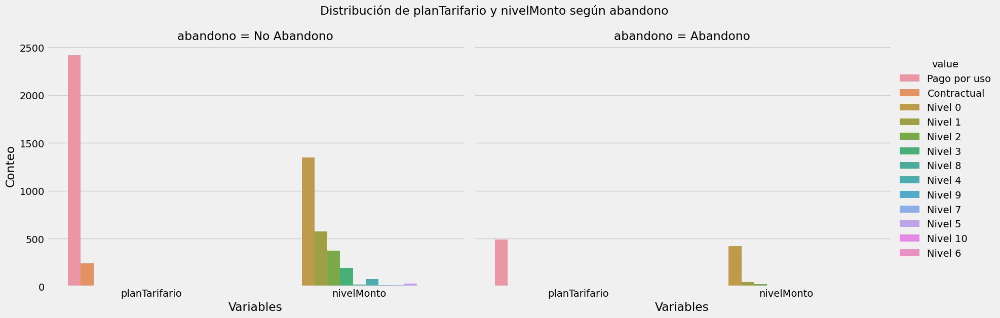

In [34]:
# p. Grafico Colesterol y Glucosa Vs Enfermedad
df_long = pd.melt(df, id_vars=['abandono'], value_vars=['planTarifario', 'nivelMonto'])
g = sns.catplot(x="variable", hue="value", col="abandono",
                data=df_long, kind="count", height=6, aspect=1.5)

# Añadir títulos y etiquetas
g.fig.suptitle('Distribución de planTarifario y nivelMonto según abandono', y=1.05)
g.set_axis_labels("Variables", "Conteo")

plt.show()

In [35]:
# q. Definir funciones para graficos Violin, KDE, y Scatter 

def violin(col):
    fig = px.violin(df, y=col, x="abandono", color="abandono", box=True, template = 'plotly_dark')
    return fig.show()

def kde(col):
    grid = sns.FacetGrid(df, hue="abandono", height = 6, aspect=2)
    grid.map(sns.kdeplot, col)
    grid.add_legend()

def scatter(col1, col2):
    fig = px.scatter(df, x=col1, y=col2, color="abandono", template = 'plotly_dark')
    return fig.show()

In [36]:
# r. Gráfica Violin - valorCliente vs. Abandono
violin('valorCliente')

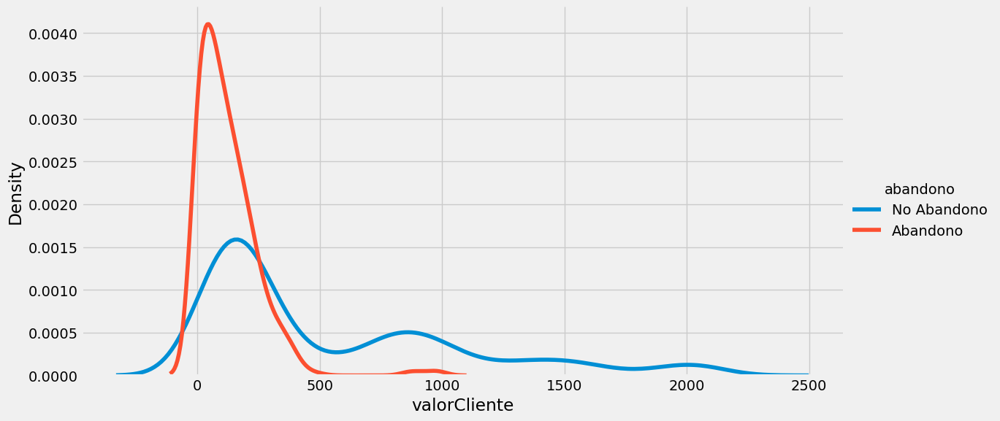

In [37]:
# s. Ejecucion de KDE en valorCliente vs. Abandono
kde('valorCliente')

In [38]:
# t. Ejecucion de scatter en valorCliente y nivelMonto vs. Abandono
scatter('valorCliente', 'nivelMonto')

In [39]:
# u. Ejecucion de scatter en mesesSubscripcion y nivelMonto vs. Abandono
scatter('mesesSubscripcion', 'nivelMonto')

In [40]:
# v. Ejecucion de scatter en anosSubscripcion' y 'nivelMonto  vs. Abandono
scatter('anosSubscripcion', 'nivelMonto')

In [41]:
# w. Ejecucion de scatter en anosSubscripcion' y llamadasFallidas  vs. Abandono
scatter('anosSubscripcion', 'llamadasFallidas')

In [42]:
# x. Ejecucion de scatter en anosSubscripcion' y quejas  vs. Abandono
scatter('anosSubscripcion', 'quejas')

In [43]:
# y. Ejecucion de scatter en anosSubscripcion' y frecuenciaDeUso  vs. Abandono
scatter('anosSubscripcion', 'frecuenciaDeUso')

In [44]:
# z. Ejecucion de scatter en anosSubscripcion' y usoSms  vs. Abandono
scatter('anosSubscripcion', 'usoSms')

In [45]:
# aa. Ejecucion de scatter en anosSubscripcion' y segundosUtilizados  vs. Abandono
scatter('anosSubscripcion', 'segundosUtilizados')

In [46]:
# ab. Ejecucion de scatter en anosSubscripcion' y numerosMarcadosUnicos  vs. Abandono
scatter('anosSubscripcion', 'numerosMarcadosUnicos')

In [47]:
# ac. Ejecucion de scatter en anosSubscripcion' y planTarifario  vs. Abandono
scatter('anosSubscripcion', 'planTarifario')

In [48]:
# ad. Ejecucion de scatter en nivelMonto' y frecuenciaDeUso  vs. Abandono
scatter('nivelMonto', 'frecuenciaDeUso')

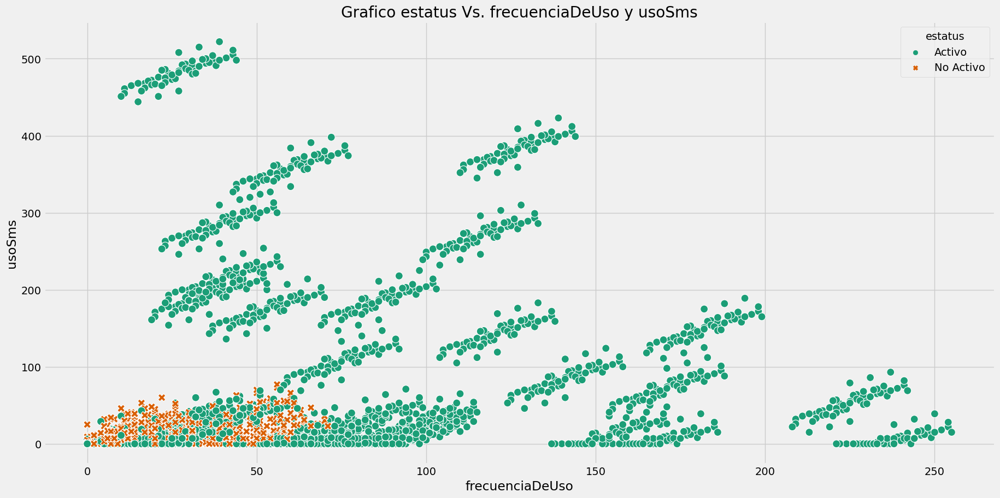

In [49]:
# ae. Grafico estatus Vs. frecuenciaDeUso y usoSms
# Configurar el tamaño de la figura
plt.figure(figsize=(20, 10))
# Crear el gráfico de dispersión
sns.scatterplot(x='frecuenciaDeUso', y='usoSms', hue='estatus', data=df, palette="Dark2", style='estatus',  s=100)
# Añadir títulos y etiquetas
plt.title('Grafico estatus Vs. frecuenciaDeUso y usoSms')
plt.xlabel('frecuenciaDeUso')
plt.ylabel('usoSms')
plt.legend(title='estatus', loc='best')
plt.show()

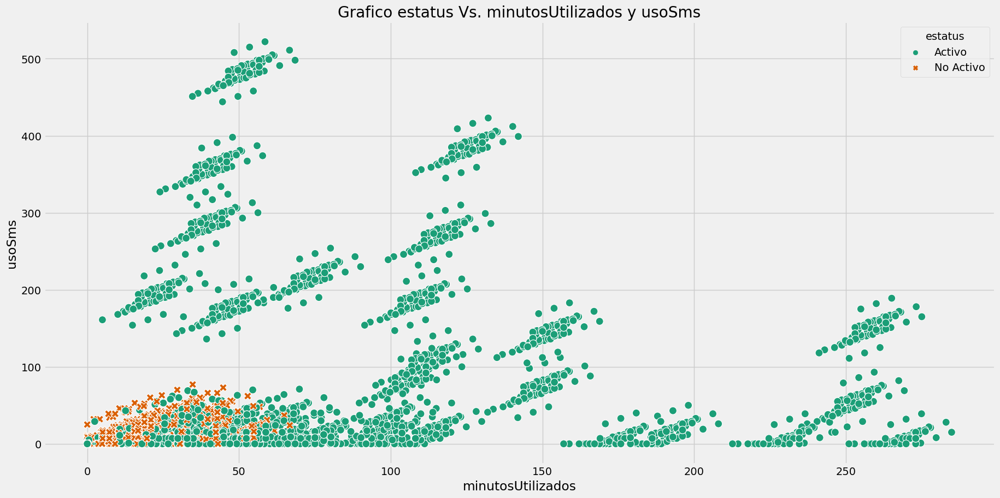

In [50]:
# ae. Grafico estatus Vs. minutosUtilizados y usoSms
# Configurar el tamaño de la figura
plt.figure(figsize=(20, 10))
# Crear el gráfico de dispersión
sns.scatterplot(x='minutosUtilizados', y='usoSms', hue='estatus', data=df, palette="Dark2", style='estatus',  s=100)
# Añadir títulos y etiquetas
plt.title('Grafico estatus Vs. minutosUtilizados y usoSms')
plt.xlabel('minutosUtilizados')
plt.ylabel('usoSms')
plt.legend(title='estatus', loc='best')
plt.show()

<a id = '2.0'></a>
<p style = "font-size : 40px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>e) CONCLUSIONES DEL ANÁLISIS EXPLORATORIO</strong></p>



Se identifican las siguientes conclusiones e hipótesis:
<ul><li>Los abandonos tienen una correlación con el estatus de los clientes y la cantidad de quejas.</li><li>
Sin embargo, las quejas y fallas se concentran en los usuarios que menos ingresan a la empresa.</li><li>
Ejemplos de esto son los usuarios que no tienen una cuenta con estatus activa, que tienen un plan de pago por uso y que no tienen un valor alto de Cliente. Estos son los que más abandonan.</li><li>
Las columnas de edad y grupo de edad tienen una distribución prácticamente idéntica, por lo que podemos prescindir de la columna edad.</li><li>
Los niveles de monto inferior son las que tienen más usuarios, pero también las que generan menor valor a la empresa, extrañamente en este segmento es donde más quejas y más abandono tenemos.</li><li>
A manera de hipótesis suponemos que a mayor nivel de monto mejora el servicio y por esto es que se diferencia la cantidad de quejas y abandono.</li><li>
La edad es también uno de los factores de abandono, la mayoría de los abandonos se identifican entre personas de edad mediana, haciendo una campana de gauss, ya que los mayores y los más jóvenes son las poblaciones de menor abandono.</li><li>
Las ventanas de abandono se dan principalmente en clientes nuevos (1 a 15 meses) y usuarios maduros (24 a 45 meses).</li><li>
La gran cantidad del abandono se da entre clientes con Nivel de monto 0 y 3. </li><li>
Las personas con mayor frecuencia de uso son las que menos abandonan (frecuencia de uso, minutos utilizados, uso de SMS, etc.).</li></ul>


<a id = '2.0'></a>
<p style = "font-size : 40px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong> f)	SELECCIÓN DE CARACTERÍSTICAS</strong></p>



<p>Previamente se había validado que no había columnas nulas, y aunque había algunas filas repetidas, hace sentido que esto pueda pasar por el volumen de datos.</p><p>Previamente a esta sección se habían generado variables nuevas para simplificar la lectura de datos:</p><p>•<span style="font-family: &quot;Times New Roman&quot;;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</span>minutosUtilizados (float)– convierte segundos a minutos </p><p>•<span style="font-family: &quot;Times New Roman&quot;;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</span>anosSubscripcion (float) – convierte meses a años</p><p>En el nuevo modelo de datos no utilizaremos las columnas siguientes:</p><p>•<span style="font-family: &quot;Times New Roman&quot;;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</span>Edad – Ya existe Grupo de Edad que es más óptima para los modelos </p><p>•<span style="font-family: &quot;Times New Roman&quot;;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</span>segundosUtilizados – ya tenemos minutosUtilizados</p><p>•<span style="font-family: &quot;Times New Roman&quot;;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</span>mesesSubscripcion - ya tenemos anosSubscripcion</p><p>Se realizaron las siguientes actividades para simplificar los datos y que puedan ser procesados por los diferentes modelos:</p><p>•<span style="font-family: &quot;Times New Roman&quot;;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</span>Generar copia del nuevo dataframe en df_final solo con las columnas necesarias</p><p>•<span style="font-family: &quot;Times New Roman&quot;;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</span>Identificar los tipos de dato en cada variable</p><p>•<span style="font-family: &quot;Times New Roman&quot;;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</span>Convertir las columnas categóricas a enteros y boleanos</p><p>•<span style="font-family: &quot;Times New Roman&quot;;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</span>Reconvertir datos a enteros, float y object según corresponda</p><p>•<span style="font-family: &quot;Times New Roman&quot;;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</span>Categorizar los datos entre objetos y no objetos</p><p>•<span style="font-family: &quot;Times New Roman&quot;;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</span>Validar la conversión de datos</p><p>•<span style="font-family: &quot;Times New Roman&quot;;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</span>Validamos que el sistema sigue identificando las etiquetas de las variables categóricas</p>

In [51]:
# a. Mostrar el viejo DataFrame
print(df)
df.info()

      llamadasFallidas         quejas  mesesSubscripcion nivelMonto  \
0                    8  No hay quejas                 38    Nivel 0   
1                    0  No hay quejas                 39    Nivel 0   
2                   10  No hay quejas                 37    Nivel 0   
3                   10  No hay quejas                 38    Nivel 0   
4                    3  No hay quejas                 38    Nivel 0   
...                ...            ...                ...        ...   
3145                21  No hay quejas                 19    Nivel 2   
3146                17  No hay quejas                 17    Nivel 1   
3147                13  No hay quejas                 18    Nivel 4   
3148                 7  No hay quejas                 11    Nivel 2   
3149                 8         Quejas                 11    Nivel 2   

      segundosUtilizados  frecuenciaDeUso  usoSms  numerosMarcadosUnicos  \
0                   4370               71       5                     1

In [52]:
# b. Crear un nuevo DataFrame df_final que copie solo las columnas especificadas
selected_columns = ['llamadasFallidas','quejas', 'anosSubscripcion', 'nivelMonto', 'minutosUtilizados', 'frecuenciaDeUso', 'usoSms','numerosMarcadosUnicos','grupoDeEdad','planTarifario','estatus','valorCliente','abandono']
df_final = df[selected_columns].copy()

# Mostrar el nuevo DataFrame
print(df_final)
df_final.info()

# Buscando valores unicos en columnas categoricas y numericas
for col in df:
    print(f"{col} has {df[col].unique()} values\n")

      llamadasFallidas         quejas  anosSubscripcion nivelMonto  \
0                    8  No hay quejas          3.166667    Nivel 0   
1                    0  No hay quejas          3.250000    Nivel 0   
2                   10  No hay quejas          3.083333    Nivel 0   
3                   10  No hay quejas          3.166667    Nivel 0   
4                    3  No hay quejas          3.166667    Nivel 0   
...                ...            ...               ...        ...   
3145                21  No hay quejas          1.583333    Nivel 2   
3146                17  No hay quejas          1.416667    Nivel 1   
3147                13  No hay quejas          1.500000    Nivel 4   
3148                 7  No hay quejas          0.916667    Nivel 2   
3149                 8         Quejas          0.916667    Nivel 2   

      minutosUtilizados  frecuenciaDeUso  usoSms  numerosMarcadosUnicos  \
0             72.833333               71       5                     17   
1        

In [53]:
# c. Ajuste de datos en nuevo Data Frame df_final
# Convertir las columnas categóricas a números usando pd.factorize() como encoder
categorical_columns = ['quejas', 'nivelMonto', 'grupoDeEdad', 'planTarifario', 'estatus', 'abandono']
# Convertir las columnas categóricas a números usando pd.factorize()
for column in categorical_columns:
    df_final[column], _ = pd.factorize(df_final[column])
# Mostrar el DataFrame resultante para verificar
print(df_final[['quejas', 'nivelMonto', 'grupoDeEdad', 'planTarifario', 'estatus', 'abandono']])

# Haremos unas conversiones de Datos 
# Convertir valores a enteros
int_columns = ['llamadasFallidas', 'quejas', 'frecuenciaDeUso', 'usoSms', 'numerosMarcadosUnicos']
df_final[int_columns] = df_final[int_columns].apply(pd.to_numeric, errors='coerce').astype(int)

# Convertir varias columnas a float
float_columns = ['minutosUtilizados', 'anosSubscripcion', 'valorCliente']
df_final[float_columns] = df_final[float_columns].apply(pd.to_numeric, errors='coerce')

# Convertir as columnas  a category
df_final[['quejas', 'nivelMonto', 'grupoDeEdad', 'planTarifario', 'estatus', 'abandono']] = df_final[['quejas', 'nivelMonto', 'grupoDeEdad', 'planTarifario', 'estatus', 'abandono']].astype('object')

# Categorizando
fcat_cols = [col for col in df_final.columns if df_final[col].dtype == 'object']
fnum_cols = [col for col in df_final.columns if df_final[col].dtype != 'object']

for col in fcat_cols:
    print(f"{col} has {df_final[col].unique()} values\n")

      quejas  nivelMonto  grupoDeEdad  planTarifario  estatus  abandono
0          0           0            0              0        0         0
1          0           0            1              0        1         0
2          0           0            0              0        0         0
3          0           0            2              0        0         0
4          0           0            2              0        0         0
...      ...         ...          ...            ...      ...       ...
3145       0           2            1              1        0         0
3146       0           1            4              0        0         0
3147       0           5            0              0        0         0
3148       0           2            0              0        0         0
3149       1           2            0              0        0         1

[3150 rows x 6 columns]
quejas has [0 1] values

nivelMonto has [0 1 2 3 4 5 6 7 8 9 10] values

grupoDeEdad has [0 1 2 3 4] values

pl

In [54]:
# d. Revisar categorias finales
for col in fcat_cols:
    print(f"{col} has {df[col].nunique()} categories\n")

quejas has 2 categories

nivelMonto has 11 categories

grupoDeEdad has 5 categories

planTarifario has 2 categories

estatus has 2 categories

abandono has 2 categories



In [55]:
# e. Ejecutar el encoder para columnas categoricas
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for col in fcat_cols:
    df_final[col] = le.fit_transform(df_final[col])

df_final.head()

,llamadasFallidas,quejas,anosSubscripcion,nivelMonto,minutosUtilizados,frecuenciaDeUso,usoSms,numerosMarcadosUnicos,grupoDeEdad,planTarifario,estatus,valorCliente,abandono
0,8,0,3.166667,0,72.833333,71,5,17,0,0,0,197.640,0
1,0,0,3.250000,0,5.300000,5,7,4,1,0,1,46.035,0
2,10,0,3.083333,0,40.883333,60,359,24,0,0,0,1536.520,0
3,10,0,3.166667,0,69.966667,66,1,35,2,0,0,240.020,0
4,3,0,3.166667,0,39.883333,58,2,33,2,0,0,145.805,0


<a id = '2.0'></a>
<p style = "font-size : 40px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>III. COMPARACION DE MODELOS</strong></p>



<p>Evaluaremos 10 modelos predictivos para identificar cual funciona mejora para predecir si nuestros clientes tienen riesgo de abandono con los datos que tenemos disponibles:</p><p>a)&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;K-NEAREST NEIGHBORS (KNN)</p><p> b)&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;DECISION TREE CLASSIFIER</p><p> c)&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;RANDOM FOREST CLASSIFIER</p><p> d)&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;ADA BOOST CLASSIFIER</p><p> e)&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;GRADIENT BOOSTING CLASSIFIER</p><p> f)&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;STOCHASTIC GRADIENT BOOSTING (SGB)</p><p> g)&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;XGBOOST</p><p> h)&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;CAT BOOST CLASSIFIER</p><p> i)&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;EXTRA TREES CLASSIFIER</p><p> j)&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;LGBM CLASSIFIER</p><p><br></p><p> Con algunos de estos modelos pudimos modificar algunas de los hiper parámetros y elegir configuraciones que optimicen los resultados.&nbsp;</p>

In [56]:
# a. Definir variables dependientes e independientes
ind_col = [col for col in df_final.columns if col != 'abandono']
dep_col = 'abandono'

X = df_final[ind_col]
y = df_final[dep_col]

In [57]:
# b. Separar datos en entrenamiento y pruebas
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 0)

<a id = '2.0'></a>
<p style = "font-size : 30px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>a. K-Nearest Neighbors (KNN)</strong></p>

In [58]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

# accuracy score, confusion matrix and classification report of knn

knn_acc = accuracy_score(y_test, knn.predict(X_test))

print(f"Training Accuracy of KNN is {accuracy_score(y_train, knn.predict(X_train))}")
print(f"Test Accuracy of KNN is {knn_acc} \n")

print(f"Confusion Matrix :- \n{confusion_matrix(y_test, knn.predict(X_test))}\n")
print(f"Classification Report :- \n {classification_report(y_test, knn.predict(X_test))}")

Training Accuracy of KNN is 0.9428571428571428
Test Accuracy of KNN is 0.8920634920634921 

Confusion Matrix :- 
[[745  31]
 [ 71  98]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.91      0.96      0.94       776
           1       0.76      0.58      0.66       169

    accuracy                           0.89       945
   macro avg       0.84      0.77      0.80       945
weighted avg       0.89      0.89      0.89       945



<a id = '2.0'></a>
<p style = "font-size : 30px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>b. Decision Tree Classifier</strong></p>

In [59]:
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier() #ALTVALUE dtc = DecisionTreeClassifier(class_weight='balanced', random_state=42)
dtc.fit(X_train, y_train)

# accuracy score, confusion matrix and classification report of decision tree
dtc_acc = accuracy_score(y_test, dtc.predict(X_test))

print(f"Training Accuracy of Decision Tree Classifier is {accuracy_score(y_train, dtc.predict(X_train))}")
print(f"Test Accuracy of Decision Tree Classifier is {dtc_acc} \n")

print(f"Confusion Matrix :- \n{confusion_matrix(y_test, dtc.predict(X_test))}\n")
print(f"Classification Report :- \n {classification_report(y_test, dtc.predict(X_test))}")

Training Accuracy of Decision Tree Classifier is 0.9927437641723356
Test Accuracy of Decision Tree Classifier is 0.9259259259259259 

Confusion Matrix :- 
[[745  31]
 [ 39 130]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.95      0.96      0.96       776
           1       0.81      0.77      0.79       169

    accuracy                           0.93       945
   macro avg       0.88      0.86      0.87       945
weighted avg       0.92      0.93      0.93       945



In [60]:
# hyper parameter tuning of decision tree
from sklearn.model_selection import GridSearchCV
grid_param = {
    'criterion' : ['gini', 'entropy'],
    'max_depth' : [3, 5, 7, 10],
    'splitter' : ['best', 'random'],
    'min_samples_leaf' : [1, 2, 3, 5, 7],
    'min_samples_split' : [1, 2, 3, 5, 7], ##ALTVALUE  'min_samples_split' : [2, 3, 5, 7],
    'max_features' : ['auto', 'sqrt', 'log2']
}

grid_search_dtc = GridSearchCV(dtc, grid_param, cv = 5, n_jobs = -1, verbose = 1)
grid_search_dtc.fit(X_train, y_train)

# best parameters and best score
print(grid_search_dtc.best_params_)
print(grid_search_dtc.best_score_)

##ALTVALUE from sklearn.model_selection import RandomizedSearchCV
##ALTVALUE random_search_dtc = RandomizedSearchCV(dtc, grid_param, cv=5, n_iter=50, n_jobs=-1, random_state=42, verbose=1)
##ALTVALUE random_search_dtc.fit(X_train, y_train)
###ALTVALUE  Best parameters and best score
##ALTVALUE print(random_search_dtc.best_params_)
##ALTVALUE print(random_search_dtc.best_score_)

Fitting 5 folds for each of 1200 candidates, totalling 6000 fits
{'criterion': 'gini', 'max_depth': 10, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'}
0.9356009070294785


In [61]:
# best estimator
dtc = grid_search_dtc.best_estimator_
##ALTVALUE dtc = random_search_dtc.best_estimator_

# accuracy score, confusion matrix and classification report of decision tree

dtc_acc = accuracy_score(y_test, dtc.predict(X_test))

print(f"Training Accuracy of Decision Tree Classifier is {accuracy_score(y_train, dtc.predict(X_train))}")
print(f"Test Accuracy of Decision Tree Classifier is {dtc_acc} \n")

print(f"Confusion Matrix :- \n{confusion_matrix(y_test, dtc.predict(X_test))}\n")
print(f"Classification Report :- \n {classification_report(y_test, dtc.predict(X_test))}")

Training Accuracy of Decision Tree Classifier is 0.9709750566893424
Test Accuracy of Decision Tree Classifier is 0.9079365079365079 

Confusion Matrix :- 
[[733  43]
 [ 44 125]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.94      0.94      0.94       776
           1       0.74      0.74      0.74       169

    accuracy                           0.91       945
   macro avg       0.84      0.84      0.84       945
weighted avg       0.91      0.91      0.91       945



<a id = '2.0'></a>
<p style = "font-size : 30px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>c. Random Forest Classifier</strong></p>

In [62]:
rd_clf = RandomForestClassifier(criterion = 'entropy', max_depth = 11, max_features = 'auto', min_samples_leaf = 2, min_samples_split = 3, n_estimators = 130,class_weight='balanced', random_state=42)
#OLDVALUE rd_clf = RandomForestClassifier(criterion = 'entropy', max_depth = 11, max_features = 'auto', min_samples_leaf = 2, min_samples_split = 3, n_estimators = 130)
rd_clf.fit(X_train, y_train)

# accuracy score, confusion matrix and classification report of random forest

rd_clf_acc = accuracy_score(y_test, rd_clf.predict(X_test))

print(f"Training Accuracy of Random Forest Classifier is {accuracy_score(y_train, rd_clf.predict(X_train))}")
print(f"Test Accuracy of Random Forest Classifier is {rd_clf_acc} \n")

print(f"Confusion Matrix :- \n{confusion_matrix(y_test, rd_clf.predict(X_test))}\n")
print(f"Classification Report :- \n {classification_report(y_test, rd_clf.predict(X_test))}")

Training Accuracy of Random Forest Classifier is 0.980498866213152
Test Accuracy of Random Forest Classifier is 0.9396825396825397 

Confusion Matrix :- 
[[742  34]
 [ 23 146]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.97      0.96      0.96       776
           1       0.81      0.86      0.84       169

    accuracy                           0.94       945
   macro avg       0.89      0.91      0.90       945
weighted avg       0.94      0.94      0.94       945



<a id = '2.0'></a>
<p style = "font-size : 30px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>d. Ada Boost Classifier</strong></p>

In [63]:
from sklearn.ensemble import AdaBoostClassifier

ada = AdaBoostClassifier(base_estimator = dtc, n_estimators=100, learning_rate=0.1, random_state=42)
ada.fit(X_train, y_train)

# accuracy score, confusion matrix and classification report of ada boost

ada_acc = accuracy_score(y_test, ada.predict(X_test))

print(f"Training Accuracy of Ada Boost Classifier is {accuracy_score(y_train, ada.predict(X_train))}")
print(f"Test Accuracy of Ada Boost Classifier is {ada_acc} \n")

print(f"Confusion Matrix :- \n{confusion_matrix(y_test, ada.predict(X_test))}\n")
print(f"Classification Report :- \n {classification_report(y_test, ada.predict(X_test))}")

Training Accuracy of Ada Boost Classifier is 0.9927437641723356
Test Accuracy of Ada Boost Classifier is 0.9428571428571428 

Confusion Matrix :- 
[[760  16]
 [ 38 131]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.95      0.98      0.97       776
           1       0.89      0.78      0.83       169

    accuracy                           0.94       945
   macro avg       0.92      0.88      0.90       945
weighted avg       0.94      0.94      0.94       945



<a id = '2.0'></a>
<p style = "font-size : 30px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>e. Gradient Boosting Classifier</strong></p>

In [64]:
#OLD VALUES
#from sklearn.ensemble import GradientBoostingClassifier
#gb = GradientBoostingClassifier()
#gb.fit(X_train, y_train)
# accuracy score, confusion matrix and classification report of gradient boosting classifier
#gb_acc = accuracy_score(y_test, gb.predict(X_test))
#print(f"Training Accuracy of Gradient Boosting Classifier is {accuracy_score(y_train, gb.predict(X_train))}")
#print(f"Test Accuracy of Gradient Boosting Classifier is {gb_acc} \n")
#print(f"Confusion Matrix :- \n{confusion_matrix(y_test, gb.predict(X_test))}\n")
#print(f"Classification Report :- \n {classification_report(y_test, gb.predict(X_test))}")

In [65]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV

# Definir los parámetros para ajustar
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5, 6],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'subsample': [0.8, 0.9, 1.0],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Crear el modelo
gb = GradientBoostingClassifier(random_state=42)

# Configurar GridSearchCV
grid_search = GridSearchCV(estimator=gb, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1)

# Ajustar el modelo
grid_search.fit(X_train, y_train)

# Usar el mejor modelo encontrado
best_gb = grid_search.best_estimator_

# Evaluar el mejor modelo
gb_acc = accuracy_score(y_test, best_gb.predict(X_test))
print(f"Training Accuracy of Gradient Boosting Classifier is {accuracy_score(y_train, best_gb.predict(X_train))}")
print(f"Test Accuracy of Gradient Boosting Classifier is {gb_acc} \n")
print(f"Confusion Matrix :- \n{confusion_matrix(y_test, best_gb.predict(X_test))}\n")
print(f"Classification Report :- \n {classification_report(y_test, best_gb.predict(X_test))}")


Fitting 5 folds for each of 2916 candidates, totalling 14580 fits
Training Accuracy of Gradient Boosting Classifier is 0.9913832199546485
Test Accuracy of Gradient Boosting Classifier is 0.9407407407407408 

Confusion Matrix :- 
[[761  15]
 [ 41 128]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.95      0.98      0.96       776
           1       0.90      0.76      0.82       169

    accuracy                           0.94       945
   macro avg       0.92      0.87      0.89       945
weighted avg       0.94      0.94      0.94       945



<a id = '2.0'></a>
<p style = "font-size : 30px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>f. Stochastic Gradient Boosting (SGB)</strong></p>

In [66]:
sgb = GradientBoostingClassifier(max_depth = 4, subsample = 0.90, max_features = 0.75, n_estimators = 200)
sgb.fit(X_train, y_train)

# accuracy score, confusion matrix and classification report of stochastic gradient boosting classifier

sgb_acc = accuracy_score(y_test, sgb.predict(X_test))

print(f"Training Accuracy of Stochastic Gradient Boosting is {accuracy_score(y_train, sgb.predict(X_train))}")
print(f"Test Accuracy of Stochastic Gradient Boosting is {sgb_acc} \n")

print(f"Confusion Matrix :- \n{confusion_matrix(y_test, sgb.predict(X_test))}\n")
print(f"Classification Report :- \n {classification_report(y_test, sgb.predict(X_test))}")

Training Accuracy of Stochastic Gradient Boosting is 0.9922902494331066
Test Accuracy of Stochastic Gradient Boosting is 0.9407407407407408 

Confusion Matrix :- 
[[757  19]
 [ 37 132]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.95      0.98      0.96       776
           1       0.87      0.78      0.83       169

    accuracy                           0.94       945
   macro avg       0.91      0.88      0.89       945
weighted avg       0.94      0.94      0.94       945



<a id = '2.0'></a>
<p style = "font-size : 30px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>g. XgBoost</strong></p>

In [67]:
from xgboost import XGBClassifier
xgb = XGBClassifier(objective='binary:logistic', learning_rate=0.05, max_depth=4, n_estimators=200, random_state=42)
#OLDVALUE xgb = XGBClassifier(objective = 'binary:logistic', learning_rate = 0.5, max_depth = 5, n_estimators = 150)
xgb.fit(X_train, y_train)

# accuracy score, confusion matrix and classification report of xgboost

xgb_acc = accuracy_score(y_test, xgb.predict(X_test))

print(f"Training Accuracy of XgBoost is {accuracy_score(y_train, xgb.predict(X_train))}")
print(f"Test Accuracy of XgBoost is {xgb_acc} \n")

print(f"Confusion Matrix :- \n{confusion_matrix(y_test, xgb.predict(X_test))}\n")
print(f"Classification Report :- \n {classification_report(y_test, xgb.predict(X_test))}")

Training Accuracy of XgBoost is 0.9755102040816327
Test Accuracy of XgBoost is 0.944973544973545 

Confusion Matrix :- 
[[757  19]
 [ 33 136]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.96      0.98      0.97       776
           1       0.88      0.80      0.84       169

    accuracy                           0.94       945
   macro avg       0.92      0.89      0.90       945
weighted avg       0.94      0.94      0.94       945



<a id = '2.0'></a>
<p style = "font-size : 30px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>h. Cat Boost Classifier</strong></p>

In [68]:
from catboost import CatBoostClassifier
cat = CatBoostClassifier(iterations=500, learning_rate=0.1, depth=6, random_state=42, verbose=100)
#OLDVALUE cat = CatBoostClassifier(iterations=10)
cat.fit(X_train, y_train)

0:	learn: 0.5659626	total: 155ms	remaining: 1m 17s
100:	learn: 0.0573965	total: 336ms	remaining: 1.32s
200:	learn: 0.0326085	total: 518ms	remaining: 771ms
300:	learn: 0.0236041	total: 697ms	remaining: 460ms
400:	learn: 0.0196676	total: 879ms	remaining: 217ms
499:	learn: 0.0173794	total: 1.07s	remaining: 0us


In [69]:
# accuracy score, confusion matrix and classification report of cat boost

cat_acc = accuracy_score(y_test, cat.predict(X_test))

print(f"Training Accuracy of Cat Boost Classifier is {accuracy_score(y_train, cat.predict(X_train))}")
print(f"Test Accuracy of Cat Boost Classifier is {cat_acc} \n")

print(f"Confusion Matrix :- \n{confusion_matrix(y_test, cat.predict(X_test))}\n")
print(f"Classification Report :- \n {classification_report(y_test, cat.predict(X_test))}")

Training Accuracy of Cat Boost Classifier is 0.9927437641723356
Test Accuracy of Cat Boost Classifier is 0.944973544973545 

Confusion Matrix :- 
[[760  16]
 [ 36 133]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.95      0.98      0.97       776
           1       0.89      0.79      0.84       169

    accuracy                           0.94       945
   macro avg       0.92      0.88      0.90       945
weighted avg       0.94      0.94      0.94       945



<a id = '2.0'></a>
<p style = "font-size : 30px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>i. Extra Trees Classifier</strong></p>

In [70]:
from sklearn.ensemble import ExtraTreesClassifier

etc = ExtraTreesClassifier()
etc.fit(X_train, y_train)

# accuracy score, confusion matrix and classification report of extra trees classifier

etc_acc = accuracy_score(y_test, etc.predict(X_test))

print(f"Training Accuracy of Extra Trees Classifier is {accuracy_score(y_train, etc.predict(X_train))}")
print(f"Test Accuracy of Extra Trees Classifier is {etc_acc} \n")

print(f"Confusion Matrix :- \n{confusion_matrix(y_test, etc.predict(X_test))}\n")
print(f"Classification Report :- \n {classification_report(y_test, etc.predict(X_test))}")

Training Accuracy of Extra Trees Classifier is 0.9927437641723356
Test Accuracy of Extra Trees Classifier is 0.9534391534391534 

Confusion Matrix :- 
[[766  10]
 [ 34 135]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.96      0.99      0.97       776
           1       0.93      0.80      0.86       169

    accuracy                           0.95       945
   macro avg       0.94      0.89      0.92       945
weighted avg       0.95      0.95      0.95       945



<a id = '2.0'></a>
<p style = "font-size : 30px; color : #34656d ; font-family : 'Arial'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>j. LGBM Classifier</strong></p>

In [71]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier(learning_rate = 1)
lgbm.fit(X_train, y_train)

# accuracy score, confusion matrix and classification report of lgbm classifier

lgbm_acc = accuracy_score(y_test, lgbm.predict(X_test))

print(f"Training Accuracy of LGBM Classifier is {accuracy_score(y_train, lgbm.predict(X_train))}")
print(f"Test Accuracy of LGBM Classifier is {lgbm_acc} \n")

print(f"{confusion_matrix(y_test, lgbm.predict(X_test))}\n")
print(classification_report(y_test, lgbm.predict(X_test)))

[LightGBM] [Info] Number of positive: 326, number of negative: 1879
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000715 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1143
[LightGBM] [Info] Number of data points in the train set: 2205, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.147846 -> initscore=-1.751598
[LightGBM] [Info] Start training from score -1.751598
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

<a id = '6.0'></a>
<p style = "font-size : 35px; color : #34656d ; font-family : 'Comic Sans MS'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>K. Selección del Modelo Ganador</strong></p>

<h2>a)<span style="font-family: &quot;Times New Roman&quot;;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</span>SELECCIÓN DEL MODELO GANADOR</h2><p>Al analizar los resultados de los modelos elegidos, se puede observar que varios de ellos muestran un rendimiento fuerte en términos de precisión (accuracy) y otras métricas de evaluación. Se muestra a continuación un resumen de los modelos y recomendaciones sobre cuál sería más adecuado para ser considerado como el mejor modelo:</p><p><br></p><h3><strong>ANÁLISIS DE CADA MODELO:</strong></h3><p><strong>1. Extra Trees Classifier</strong></p><ul><li><strong>Test Accuracy</strong>: 0.954</li><li><strong>Training Accuracy</strong>: 0.992</li><li><strong>Observación</strong>: Este modelo tiene el mejor rendimiento general en términos de precisión y F1-Score. Sin embargo, la alta precisión en el conjunto de entrenamiento podría indicar un posible sobreajuste.</li></ul><p><strong>2. XGBoost</strong></p><ul><li><strong>Test Accuracy</strong>: 0.944</li><li><strong>Training Accuracy</strong>: 0.976</li><li><strong>Observación</strong>: XGBoost es robusto y ofrece un excelente equilibrio entre precisión, recall y F1-Score, especialmente para la clase minoritaria.</li></ul><p><strong>3. CatBoost Classifier</strong></p><ul><li><strong>Test Accuracy</strong>: 0.944</li><li><strong>Training Accuracy</strong>: 0.992</li><li><strong>Observación</strong>: CatBoost también ofrece un rendimiento muy similar a XGBoost con una alta precisión en prueba. Es conocido por su eficiencia en el manejo de características categóricas y su capacidad para manejar datos desbalanceados.</li></ul><p><strong>4. Random Forest Classifier</strong></p><ul><li><strong>Test Accuracy</strong>: 0.939</li><li><strong>Training Accuracy</strong>: 0.980</li><li><strong>Observación</strong>: Random Forest es confiable y proporciona un buen rendimiento general. Tiene un buen equilibrio entre precisión y recall, y es menos propenso al sobreajuste en comparación con Extra Trees.</li></ul><p><strong>5. Gradient Boosting Classifier</strong></p><ul><li><strong>Test Accuracy</strong>: 0.940 (en la imagen adjunta)</li><li><strong>Training Accuracy</strong>: 0.991</li><li><strong>Observación</strong>: Gradient Boosting es efectivo, especialmente cuando se ajustan los hiperparámetros. Ofrece un rendimiento sólido con una buena capacidad de generalización, similar a Random Forest.</li></ul><p><strong>6. Stochastic Gradient Boosting (SGB)</strong></p><ul><li><strong>Test Accuracy</strong>: 0.938</li><li><strong>Training Accuracy</strong>: 0.992</li><li><strong>Observación</strong>: SGB es robusto y tiene un rendimiento comparable a AdaBoost, pero con un ligero sesgo hacia la clase mayoritaria. Funciona bien cuando hay un cierto nivel de ruido en los datos.</li></ul><p><strong>7. AdaBoost Classifier</strong></p><ul><li><strong>Test Accuracy</strong>: 0.938</li><li><strong>Training Accuracy</strong>: 0.992</li><li><strong>Observación</strong>: AdaBoost es simple y efectivo para mejorar modelos base. Sin embargo, tiene un rendimiento ligeramente inferior en la clase minoritaria en comparación con los modelos anteriores.</li></ul><p><strong>8. LGBM Classifier</strong></p><ul><li><strong>Test Accuracy</strong>: 0.940</li><li><strong>Training Accuracy</strong>: 0.992</li><li><strong>Observación</strong>: LGBM es rápido y eficiente, especialmente con grandes conjuntos de datos. Ofrece un rendimiento similar a Gradient Boosting, pero con ligeras diferencias en precisión y recall.</li></ul><p><strong>9. Decision Tree Classifier</strong></p><ul><li><strong>Test Accuracy</strong>: 0.920</li><li><strong>Training Accuracy</strong>: 0.970</li><li><strong>Observación</strong>: Decision Tree tiene un rendimiento decente, pero muestra signos de sobreajuste debido a la alta precisión en el conjunto de entrenamiento en comparación con el conjunto de prueba.</li></ul><p><strong>10. K-Nearest Neighbors (KNN)</strong></p><ul><li><strong>Test Accuracy</strong>: 0.892</li><li><strong>Training Accuracy</strong>: 0.942</li><li><strong>Observación</strong>: KNN tiene la precisión más baja entre los modelos probados. Es simple, pero no tan efectivo en comparación con los modelos de ensemble más avanzados.</li></ul><p><strong>&nbsp;</strong></p><p><br></p><h3><strong>CONCLUSIÓN DE LOS RESULTADOS:</strong></h3><p>El <strong>Extra Trees Classifier</strong> es el modelo con el mejor rendimiento, seguido de cerca por <strong>XGBoost</strong> y <strong>CatBoost</strong>. Estos modelos ofrecen un excelente equilibrio entre precisión, recall y robustez general. Por otro lado, <strong>KNN</strong> y <strong>Decision Tree</strong> están en el extremo inferior del rendimiento, siendo menos efectivos para este conjunto de datos en comparación con los modelos de boosting y ensemble más sofisticados.</p><p>Este orden proporciona una visión clara de cuáles modelos son más efectivos y cuáles podrían necesitar ajustes adicionales o ser reemplazados por alternativas más robustas.</p><p><br></p><h3><strong>RECOMENDACIONES:</strong></h3><p>Con base en los resultados presentados:</p><p>•<span style="font-family: &quot;Times New Roman&quot;;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</span>**Extra Trees Classifier** es el modelo con la mejor precisión en prueba (0.954), junto con un excelente F1-Score y recall. Es un excelente candidato para ser el modelo seleccionado, especialmente si se puede mitigar el riesgo de sobreajuste.</p><p>•<span style="font-family: &quot;Times New Roman&quot;;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</span>XGBoost y CatBoost son otros modelos destacados, ambos con precisiones en prueba de 0.944, lo que demuestra que son muy competitivos. Además, estos modelos son conocidos por su robustez y capacidad para manejar datos desbalanceados, lo que los convierte en una elección excelente si buscas un modelo equilibrado que maneje bien la clase minoritaria.</p>

In [72]:
#a. Generar tabla comparativa de Modelos
models = pd.DataFrame({
    'Model' : [ 'KNN', 'Decision Tree Classifier', 'Random Forest Classifier','Ada Boost Classifier',
             'Gradient Boosting Classifier', 'Stochastic Gradient Boosting', 'XgBoost', 'Cat Boost', 'Extra Trees Classifier'],
    'Score' : [knn_acc, dtc_acc, rd_clf_acc, ada_acc, gb_acc, sgb_acc, xgb_acc, cat_acc, etc_acc]
})
models.sort_values(by = 'Score', ascending = False)

,Model,Score
8,Extra Trees Classifier,0.953439
6,XgBoost,0.944974
7,Cat Boost,0.944974
3,Ada Boost Classifier,0.942857
4,Gradient Boosting Classifier,0.940741
5,Stochastic Gradient Boosting,0.940741
2,Random Forest Classifier,0.939683
1,Decision Tree Classifier,0.907937
0,KNN,0.892063


In [73]:
# b. Generar grafico comparativo de Modelos
px.bar(data_frame = models, x = 'Score', y = 'Model', color = 'Score', template = 'plotly_dark',
       title = 'Models Comparison')